In [4]:
import glob
%matplotlib inline
import matplotlib.pyplot as plt
plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 

import numpy as np
from astropy.io import fits
import os
import difflib
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord
from ginga.util import zscale
from scipy import ndimage
import math

from astropy.io import ascii
from astropy.coordinates import Angle as A

from collections import OrderedDict

In [5]:
gaia_tab = ascii.read('table2.csv')

In [6]:
all_files = glob.glob('*drz.fits')
all_targnames = [fits.getval(f, 'targname') for f in all_files]
all_files

['icmdp30l0_drz.fits',
 'idgq050i0_drz.fits',
 'icmd28d2q_drz.fits',
 'icmdp60g0_drz.fits',
 'icmdr10j0_drz.fits',
 'idgq100i0_drz.fits',
 'idgq090i0_drz.fits',
 'idgq150i0_drz.fits',
 'icmd23jvq_drz.fits',
 'icmdr20k0_drz.fits',
 'icmdr40j0_drz.fits',
 'icmdp40o0_drz.fits',
 'icmd26ltq_drz.fits',
 'icmd20fgq_drz.fits',
 'icmd22nwq_drz.fits',
 'idgq130i0_drz.fits',
 'idgq110j0_drz.fits',
 'icmdp50g0_drz.fits',
 'idgq060i0_drz.fits',
 'icmdp9b2q_drz.fits',
 'icmd27cjq_drz.fits',
 'idgq030j0_drz.fits',
 'icmdp20g0_drz.fits',
 'idgq140i0_drz.fits',
 'idgq080i0_drz.fits',
 'icmd25ejq_drz.fits',
 'icmd21cfq_drz.fits',
 'icmdp70g0_drz.fits',
 'icmdr0ctq_drz.fits',
 'idgq040i0_drz.fits',
 'idgq070i0_drz.fits',
 'icmd24m5q_drz.fits',
 'idgqa10i0_drz.fits',
 'idgq120i0_drz.fits',
 'icmdr30l0_drz.fits',
 'idgq020i0_drz.fits',
 'icmdp80j0_drz.fits',
 'icmdp10g0_drz.fits']

In [7]:
d = {all_targnames[i]: all_files[i] for i, val in enumerate(all_files)}
d =  OrderedDict(sorted(d.items()))

In [8]:
d

OrderedDict([('ATLAS020.503022-30.867762', 'idgq020i0_drz.fits'),
             ('SDSS-J010322.19-002047.7', 'icmd20fgq_drz.fits'),
             ('SDSS-J022817.16-082716.4', 'icmdp10g0_drz.fits'),
             ('SDSS-J024854.96+334548.3', 'icmdp70g0_drz.fits'),
             ('SDSS-J072752.76+321416.1', 'icmdp80j0_drz.fits'),
             ('SDSS-J081508.78+073145.7', 'icmdp20g0_drz.fits'),
             ('SDSS-J102430.93-003207.0', 'icmd23jvq_drz.fits'),
             ('SDSS-J111059.43-170954.1', 'icmdp9b2q_drz.fits'),
             ('SDSS-J111127.30+395628.0', 'icmdr0ctq_drz.fits'),
             ('SDSS-J121405.11+453818.5', 'icmdr10j0_drz.fits'),
             ('SDSS-J130234.43+101238.9', 'icmdp30l0_drz.fits'),
             ('SDSS-J151421.27+004752.8', 'icmdp40o0_drz.fits'),
             ('SDSS-J155745.40+554609.7', 'icmdr20k0_drz.fits'),
             ('SDSS-J172135.97+294016.0', 'icmdp50g0_drz.fits'),
             ('SDSS-J181424.13+785402.9', 'icmdr30l0_drz.fits'),
             ('SDSS-J210

In [9]:
def make_cutouts(drz_file_paths, arrow_shift=(0, 0)):
    for f in drz_file_paths:
        targname = fits.getval(f, 'targname')
        
        
        if targname == 'WD-1312-029':
            targname = 'SDSSJ131445.050'
        if targname == 'WD-2327-000':
            targname = 'SDSSJ232941.330+001107.755'
        if targname == 'WD-1635+008':
            targname = 'SDSSJ163800.360+004717.822'
        if targname == 'WD-1204+023':
            targname = 'SDSSJ120650.504+020143.810'
        if targname == 'WD-0408-066':
            targname = 'SDSSJ041053.632-063027.580'
    
        match = difflib.get_close_matches(targname, gaia_tab['orig'])[0]
        
        
        if match in ['SDSSJ041053.632-063027.580',
                     'WD0554-165', 'SDSSJ172135.97+294016.0',
                     'SDSSJ203722.169-051302.964', 'WD0418-534',
                     'WD0757-606']:
            real_name = targname
        else:
            real_name = gaia_tab['name'].value[gaia_tab['orig'] == match][0]
        
        if real_name == 'SDSS-J172135.97+294016.0':
            real_name = 'SDSSJ172135.97+294016.0'
        if real_name == 'WD-0554-165':
            real_name = 'WD0554-165'
        if real_name == 'WDFS2317-29':
            real_name = 'SDSSJ203722.169-051302.964'
        
        
        print(targname, f'({real_name})', f)
            
        if f == 'icmdp9b2q_drz.fits':
            arrow_shift = (10, 10)
        if f == 'idgq090i0_drz.fits':
            arrow_shift = (-10, -30)
        if f == 'idgq110j0_drz.fits':
            arrow_shift = (19, -5)
        if f == 'idgq060i0_drz.fits':
            arrow_shift = (-5, -5)
            
        img_data = fits.getdata(f)
        img_wcs = WCS(fits.getheader(f, ext=1))
        
        # get ra, dec from gaia table
        gaia_tab_row = gaia_tab[gaia_tab['orig'] == match]
        gaia_mag = gaia_tab_row['G'][0]
        gaia_ra_targ, gaia_dec_targ = gaia_tab_row['RA_DR3'], gaia_tab_row['DEC_DR3']   # Use Gaia DR3 coordinates at epoch 2016.
        gaia_pmra_targ, gaia_pmdec_targ = gaia_tab_row['pm_ra'], gaia_tab_row['pm_dec']
        gaia_c = SkyCoord(ra=gaia_ra_targ, dec=gaia_dec_targ, frame='icrs', unit=(u.hourangle, u.deg))
        
        # get ra, dec from image
        im = fits.open(f)
        img_ra = im[0].header['ra_targ']
        img_dec = im[0].header['dec_targ']

        img_x, img_y = img_wcs.all_world2pix(img_ra, img_dec, 1)
        
        cutout = img_data[int(img_y)-100:int(img_y)+100, int(img_x)-100:int(img_x)+100]
        
        plt.figure(figsize=(10, 10))
        z1, z2 = zscale.zscale(cutout, contrast=0.25)
        plt.imshow(cutout, cmap='Greys_r', vmin=z1, vmax=z2, origin='lower')
        plt.arrow(80+arrow_shift[0], 75 + arrow_shift[1] ,12,13,width=1.,color='yellow')
        plt.title(real_name, size=25)
        
        plt.text(10, 175, 'G =' + str(gaia_mag), c='yellow', size=25, weight='bold', color='yellow')
        plt.text(10, 155, f'RA, DEC: {round(gaia_c.ra.deg[0], 3)}, {round(gaia_c.dec.deg[0], 3)}', size=25, c='yellow', weight='bold',  color='yellow')

        plt.plot([30, 68], [30, 30], '-',color='yellow',lw=5)
        plt.text(45, 20, '5" ', c='yellow', size=25, weight='bold', color='yellow')

        arrow_y, arrow_x = 190, 30

        plt.arrow(190,30,-10,0,width=1.,color='yellow')
        plt.arrow(190,30,0,10,width=1.,color='yellow')
        plt.text(175, 15, 'E', c='yellow', size=25, weight='bold', color='yellow')
        plt.text(187, 50, 'N', c='yellow', size=25, weight='bold', color='yellow')


        plt.xticks([0, 100, 200], [-100, 0, 100])
        plt.yticks([0, 100, 200], ['', 0, 100])
            
        
        plt.savefig('cutouts/'+real_name+'_cutout_NorthUp.png')
        plt.show()
        arrow_shift=(0, 0)

        

        
            


SDSS-J130234.43+101238.9 (WDFS1302+10) icmdp30l0_drz.fits


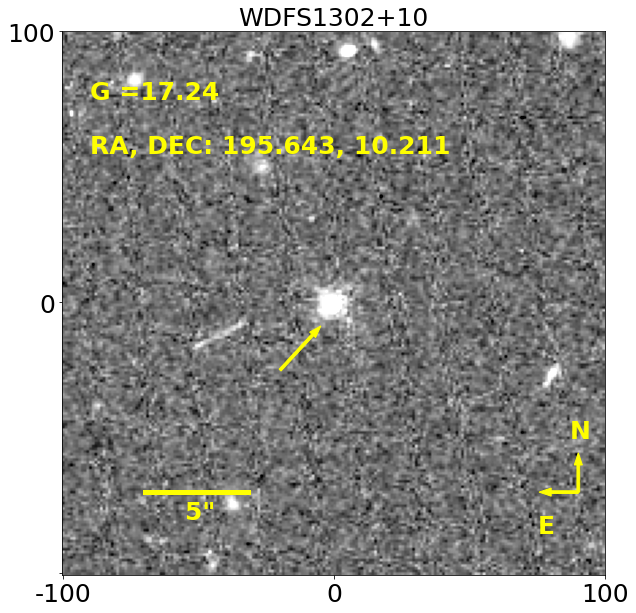

SSSJ054114.7-193038 (WDFS0541-19) idgq050i0_drz.fits


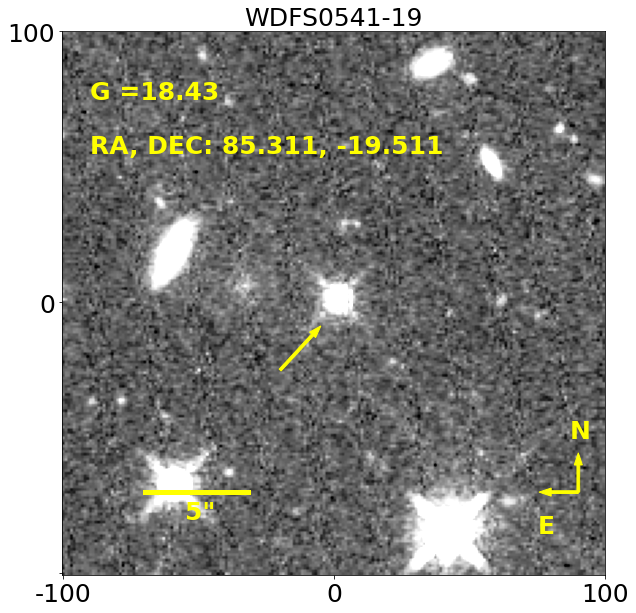

SDSSJ232941.330+001107.755 (WDFS2329+00) icmd28d2q_drz.fits


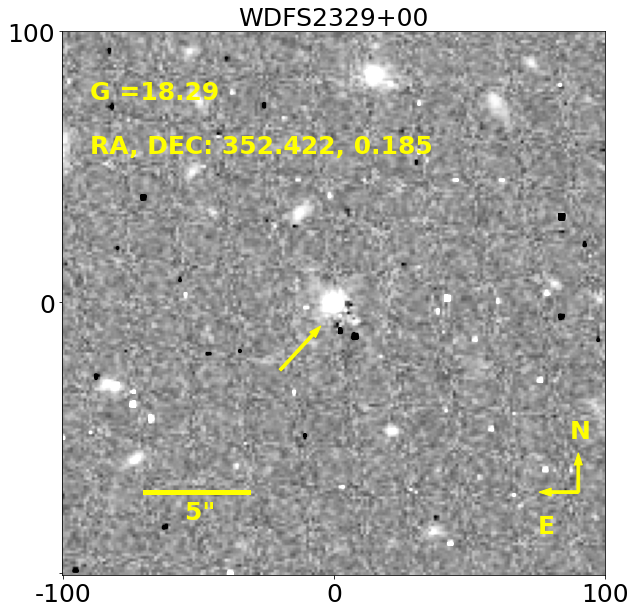

SDSS-J210150.65-054550.9 (WDFS2101-05) icmdp60g0_drz.fits


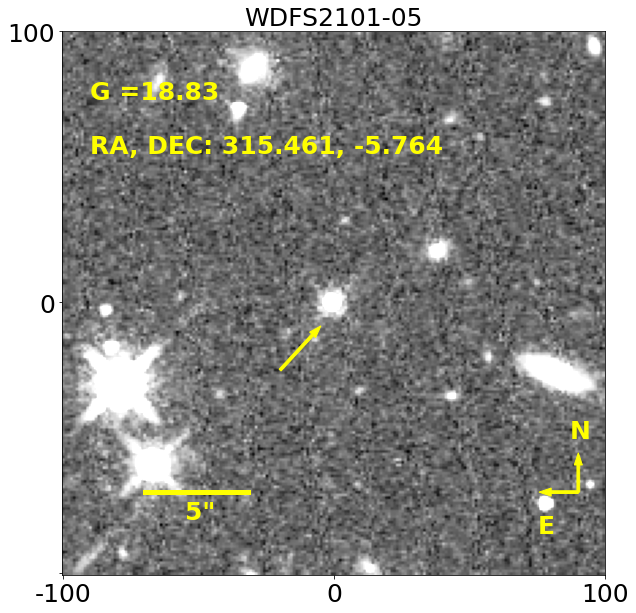

SDSS-J121405.11+453818.5 (WDFS1214+45) icmdr10j0_drz.fits


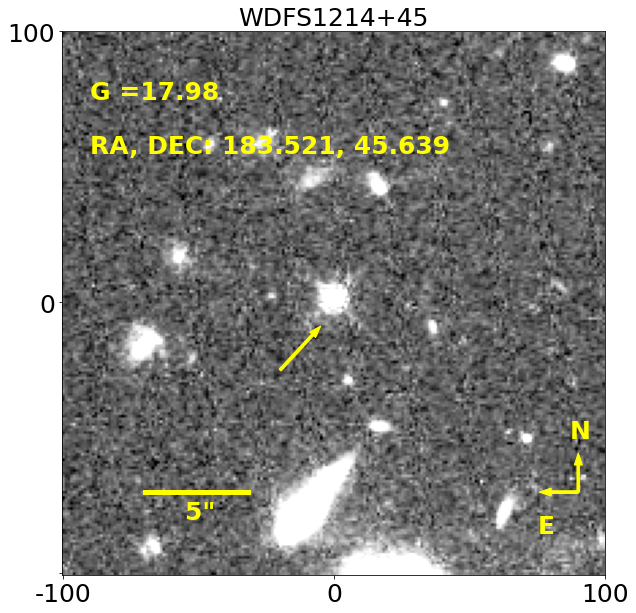

SSSJ143459.6-281904 (WDFS1434-28) idgq100i0_drz.fits


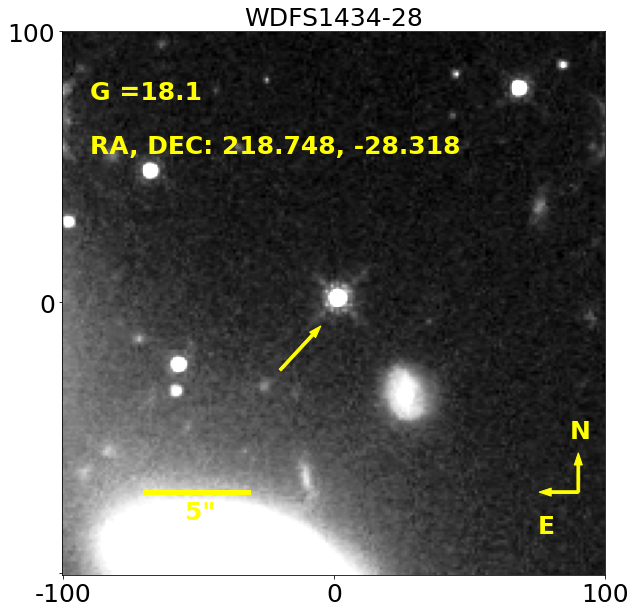

WD1203-272 (WDFS1206-27) idgq090i0_drz.fits


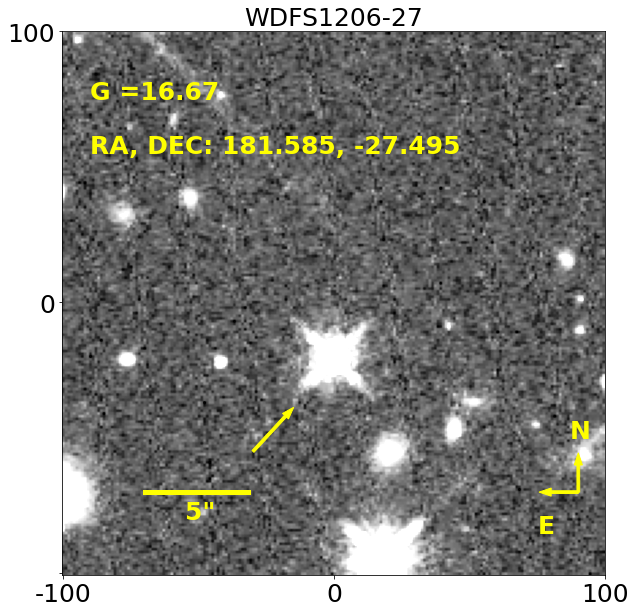

SSSJ095657.0-384128 (WDFS0956-38) idgq150i0_drz.fits


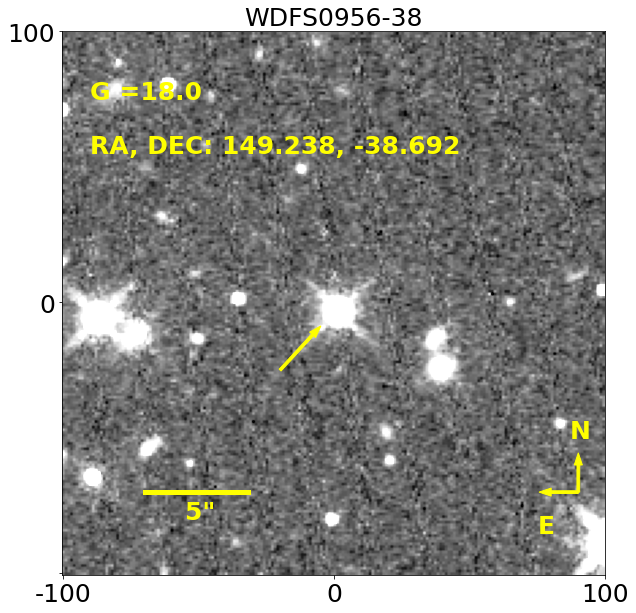

SDSS-J102430.93-003207.0 (WDFS1024-00) icmd23jvq_drz.fits


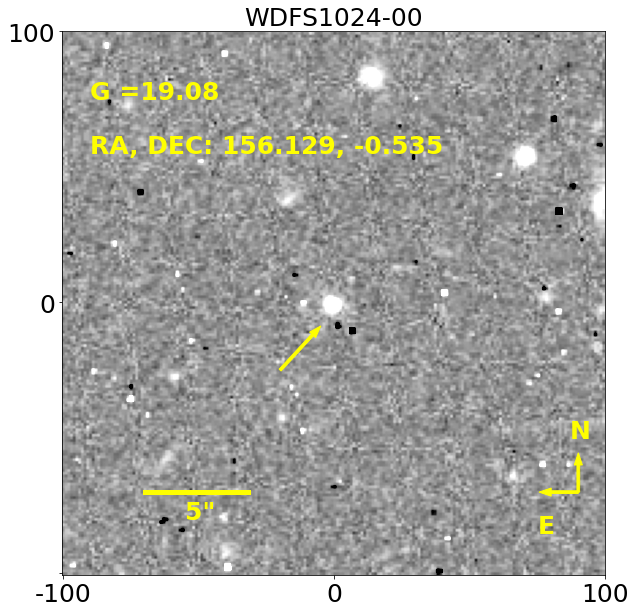

SDSS-J155745.40+554609.7 (WDFS1557+55) icmdr20k0_drz.fits


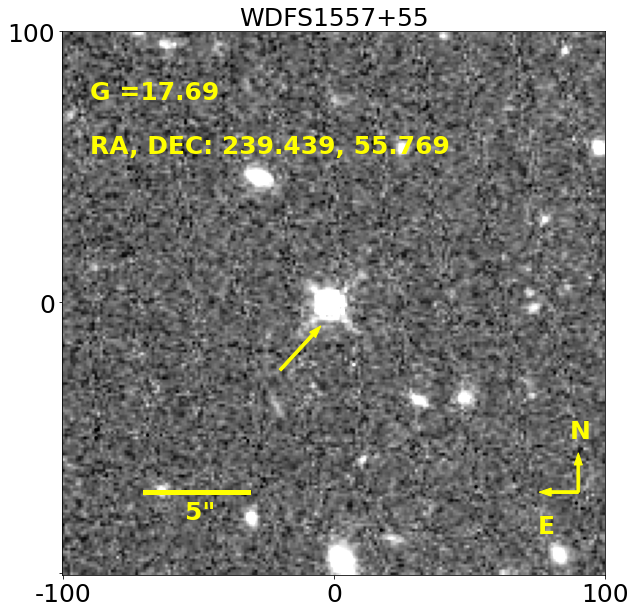

SDSS-J235144.29+355542.6 (WDFS2351+37) icmdr40j0_drz.fits


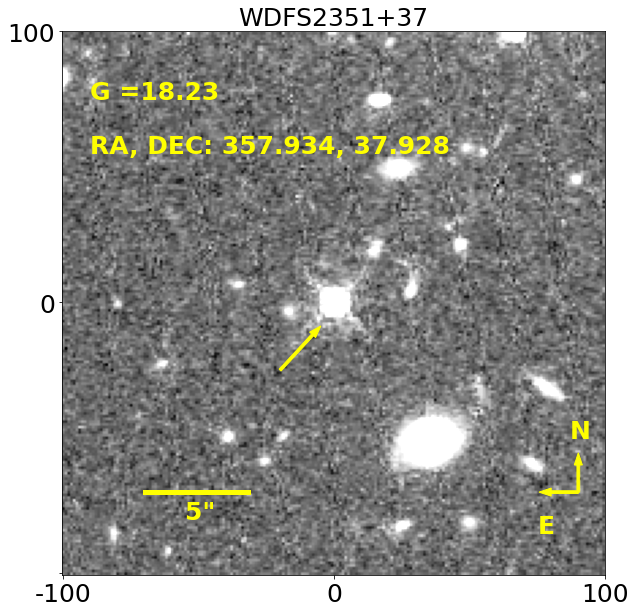

SDSS-J151421.27+004752.8 (WDFS1514+00) icmdp40o0_drz.fits


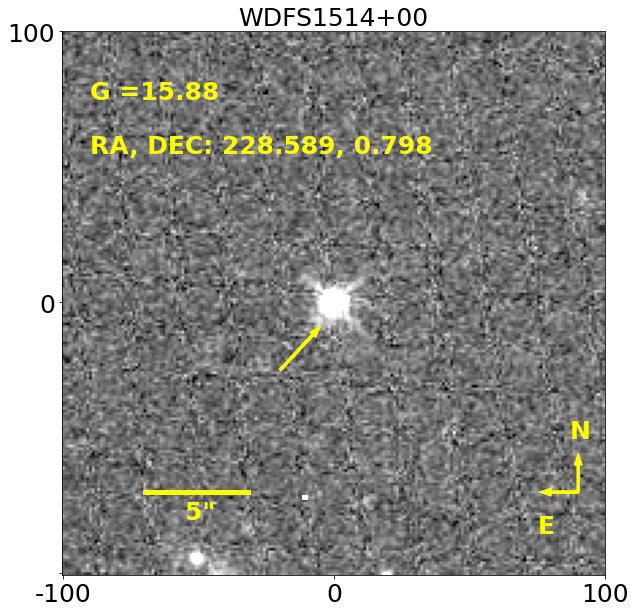

SDSSJ163800.360+004717.822 (WDFS1638+00) icmd26ltq_drz.fits


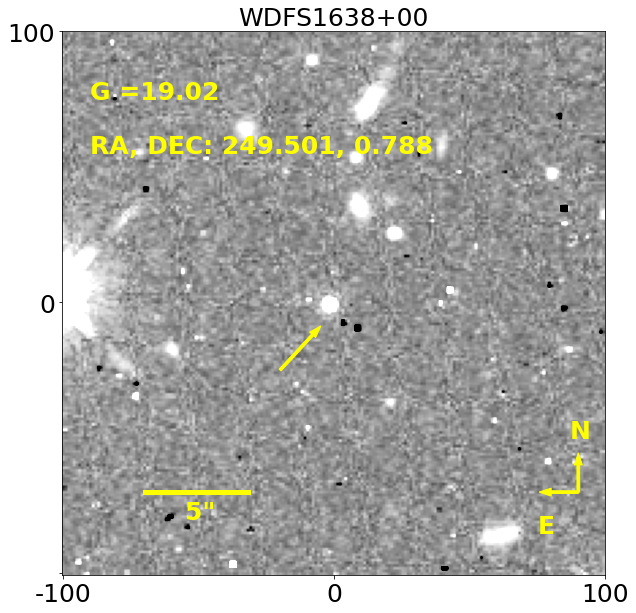

SDSS-J010322.19-002047.7 (WDFS0103-00) icmd20fgq_drz.fits


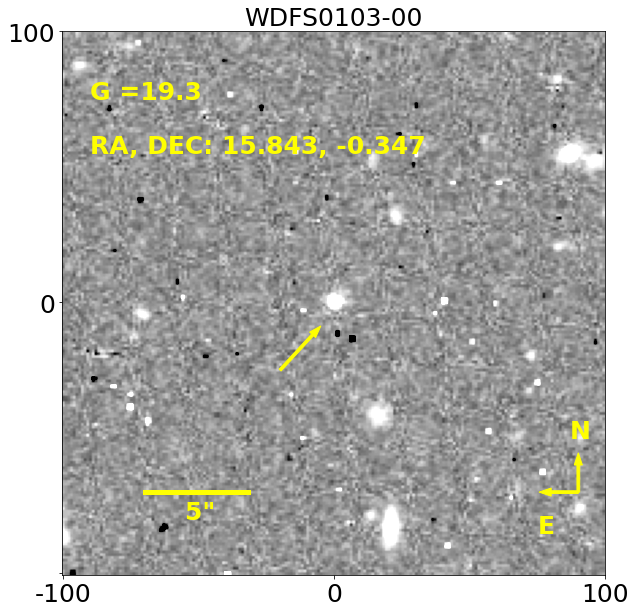

WD-0554-165 (WD0554-165) icmd22nwq_drz.fits


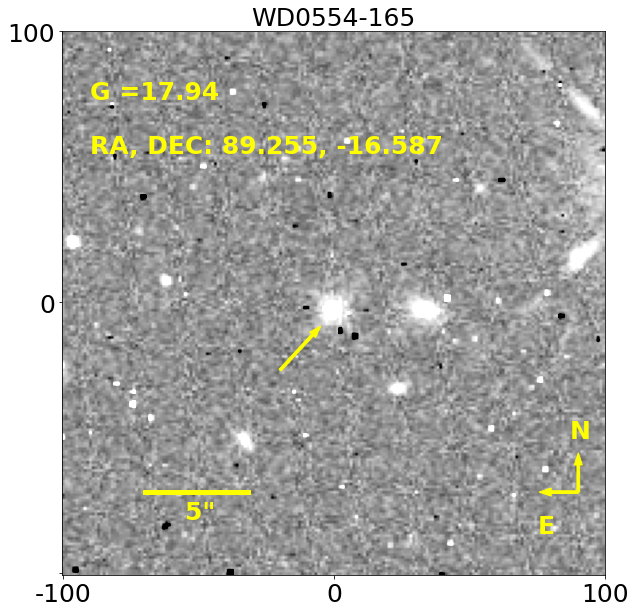

SSSJ193018.9-520345 (WDFS1930-52) idgq130i0_drz.fits


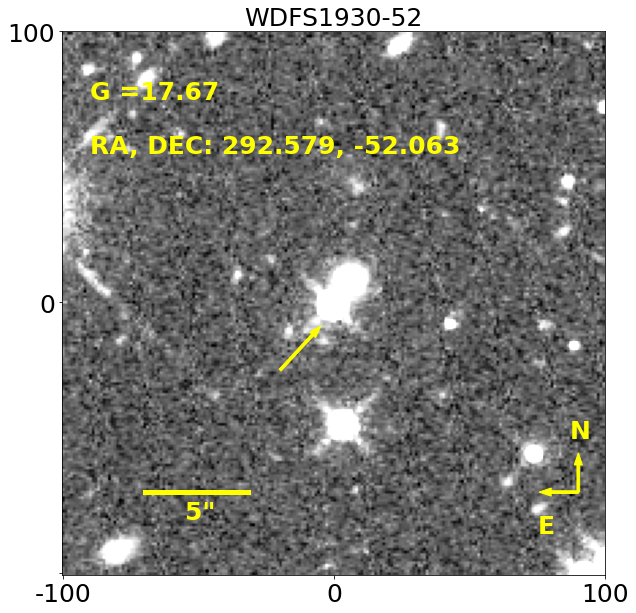

WD1529-772 (WDFS1535-77) idgq110j0_drz.fits


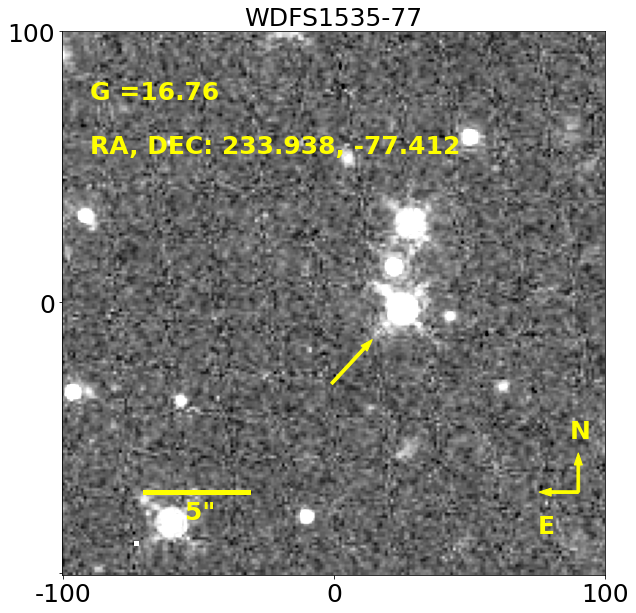

SDSS-J172135.97+294016.0 (SDSSJ172135.97+294016.0) icmdp50g0_drz.fits


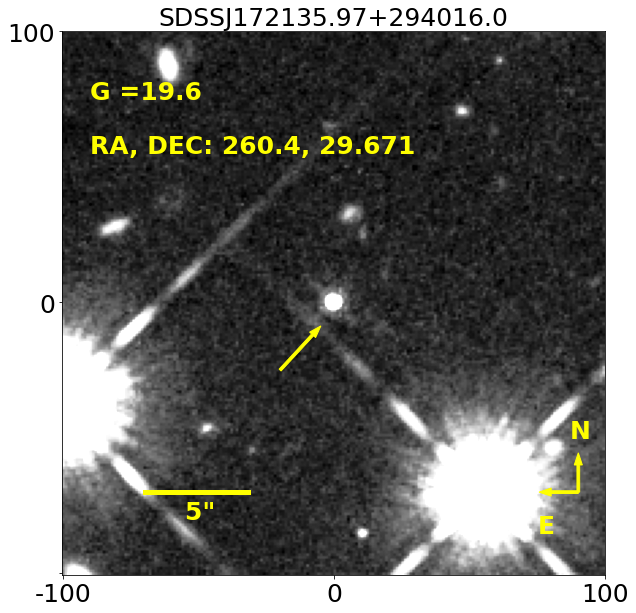

WD0757-606.2 (WD0757-606.2) idgq060i0_drz.fits


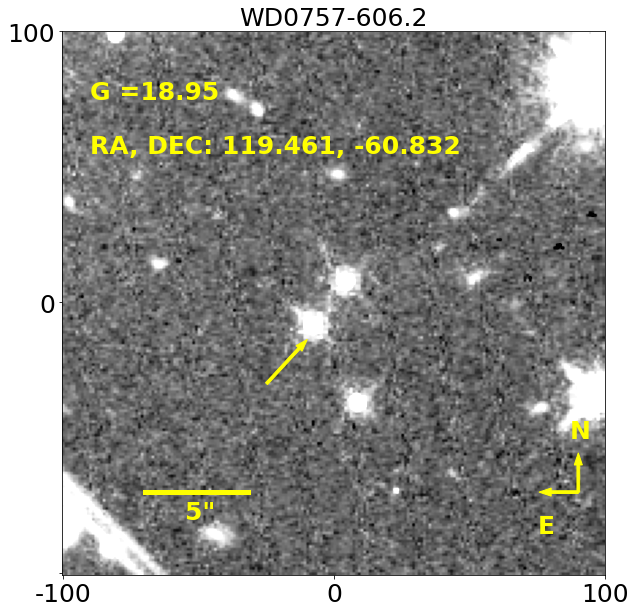

SDSS-J111059.43-170954.1 (WDFS1110-17) icmdp9b2q_drz.fits


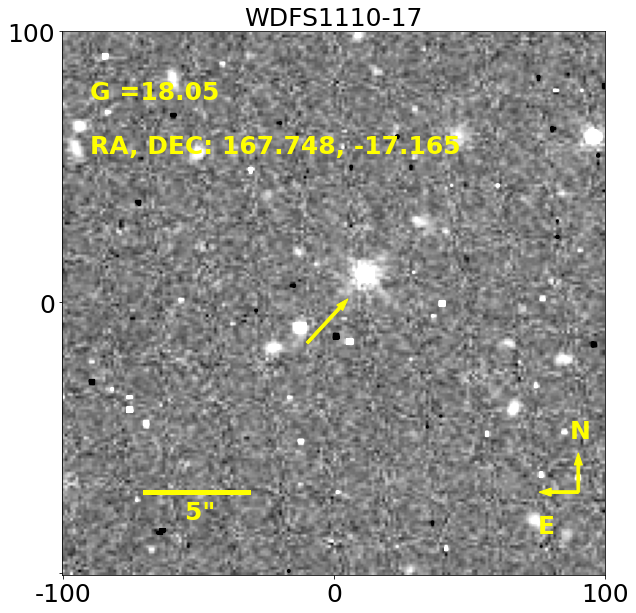

WD-2034-053 (SDSSJ203722.169-051302.964) icmd27cjq_drz.fits


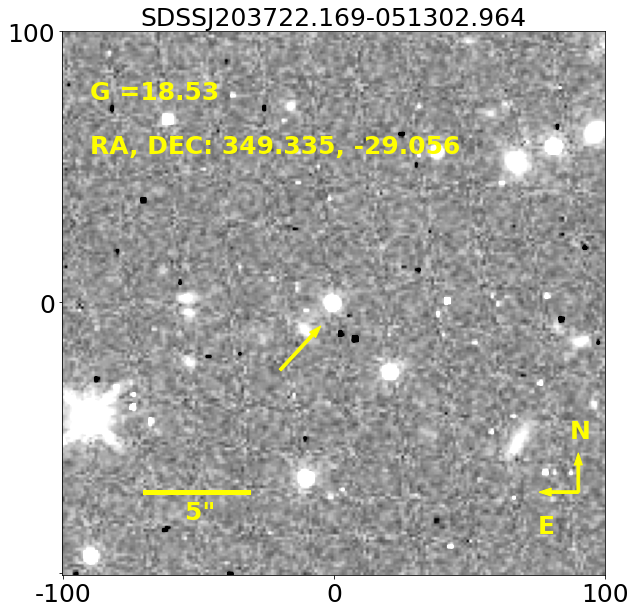

WD0418-534 (WD0418-534) idgq030j0_drz.fits


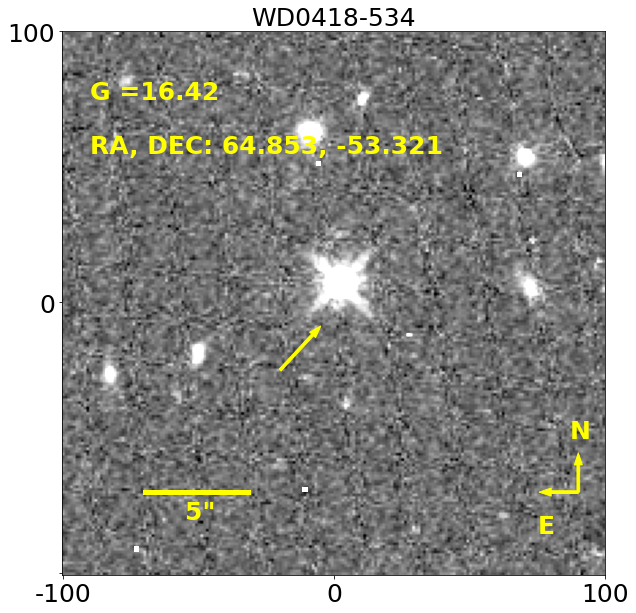

SDSS-J081508.78+073145.7 (WDFS0815+07) icmdp20g0_drz.fits


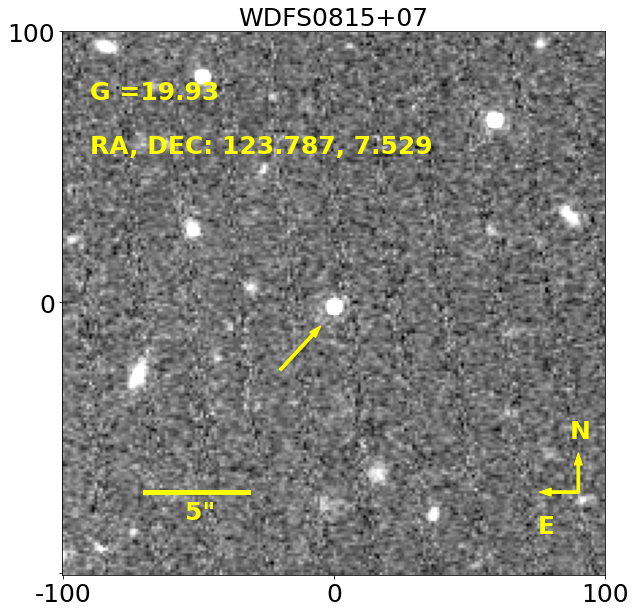

WD2314-293 (SDSSJ203722.169-051302.964) idgq140i0_drz.fits


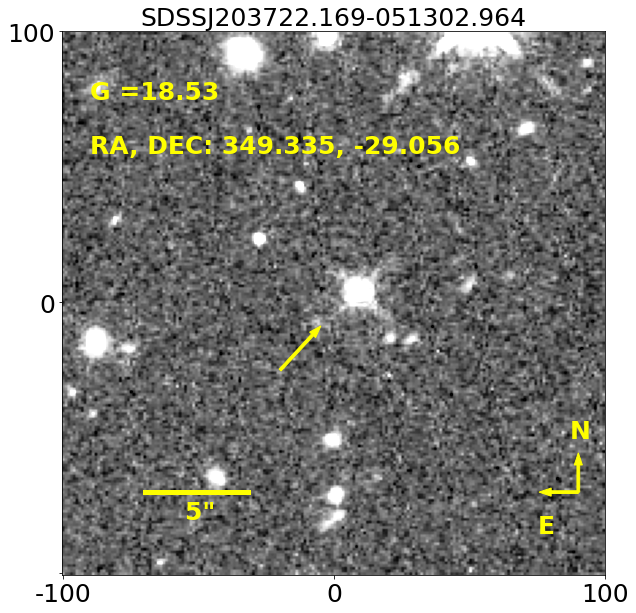

SSSJ105525.4-36121 (WDFS1055-36) idgq080i0_drz.fits


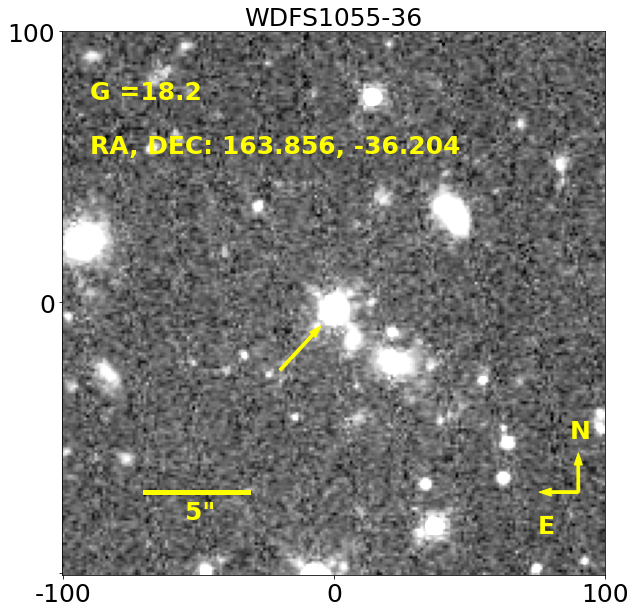

SDSSJ131445.050 (WDFS1314-03) icmd25ejq_drz.fits


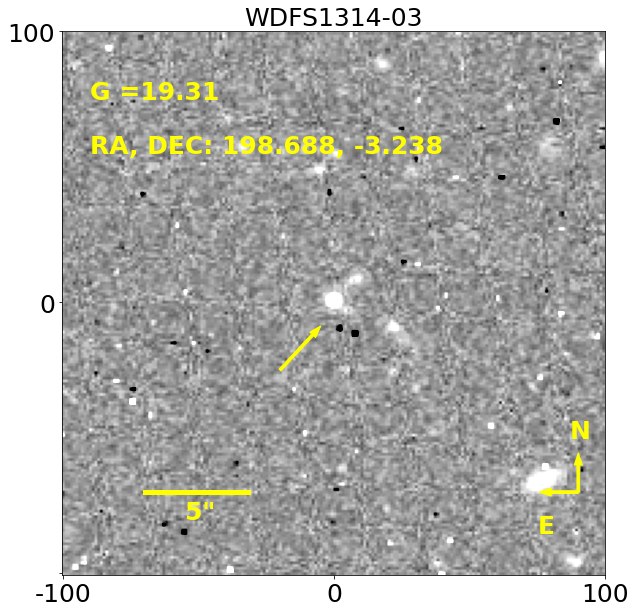

SDSSJ041053.632-063027.580 (SDSSJ041053.632-063027.580) icmd21cfq_drz.fits


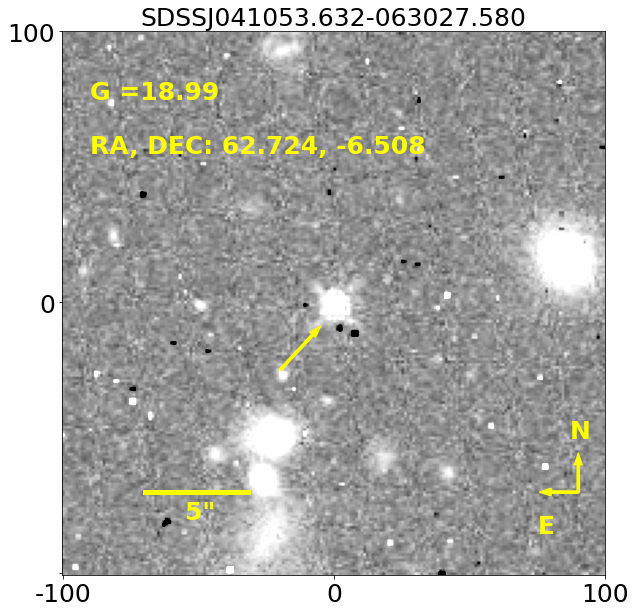

SDSS-J024854.96+334548.3 (WDFS0248+33) icmdp70g0_drz.fits


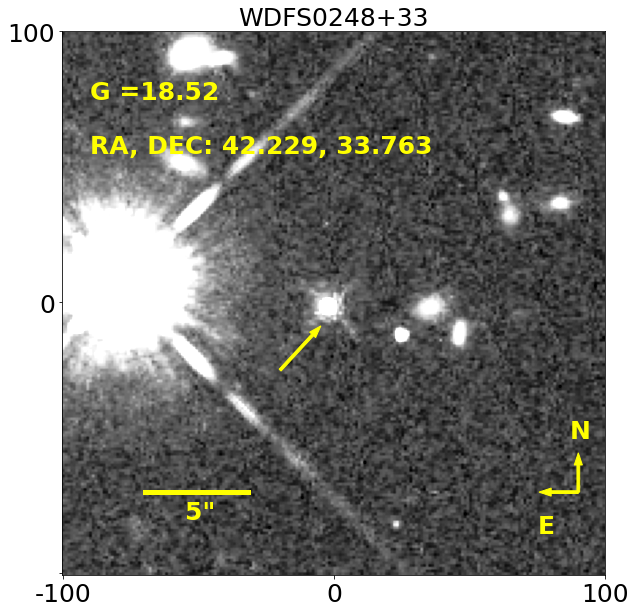

SDSS-J111127.30+395628.0 (WDFS1111+39) icmdr0ctq_drz.fits


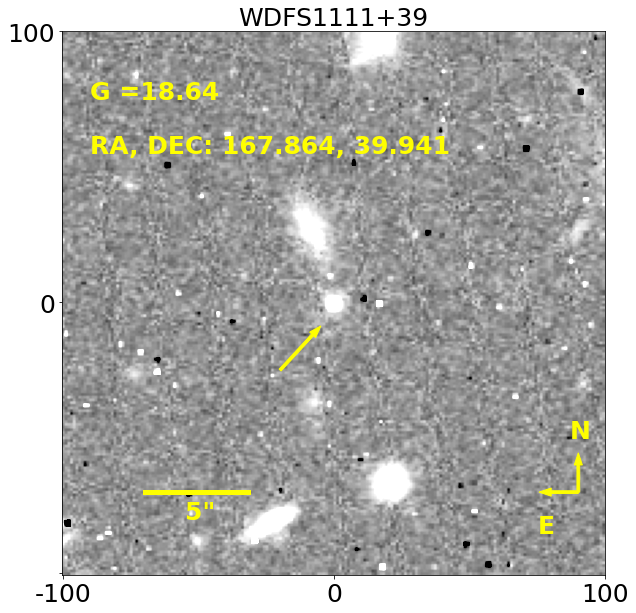

SSSJ045822.8-563734 (WDFS0458-56) idgq040i0_drz.fits


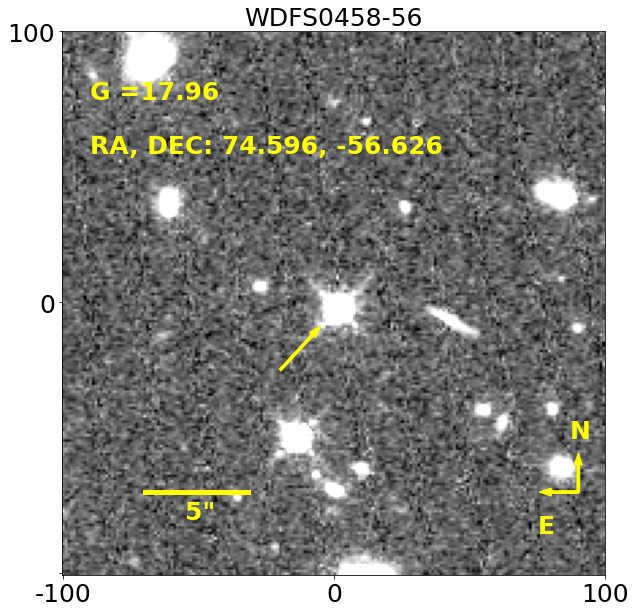

SSSJ063941.4-571232 (WDFS0639-57) idgq070i0_drz.fits


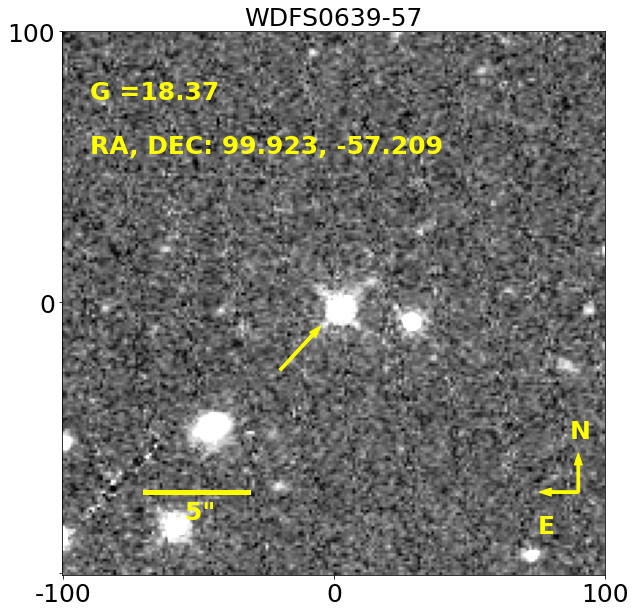

SDSSJ120650.504+020143.810 (WDFS1206+02) icmd24m5q_drz.fits


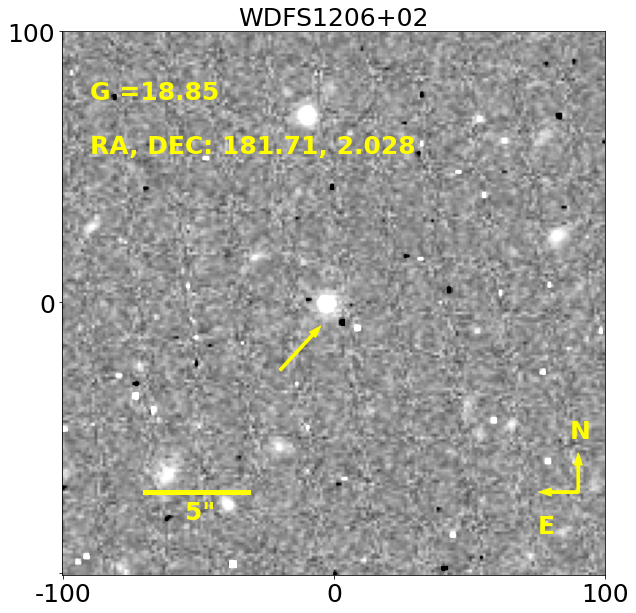

SSSJ023824.8-360224 (WDFS0238-36) idgqa10i0_drz.fits


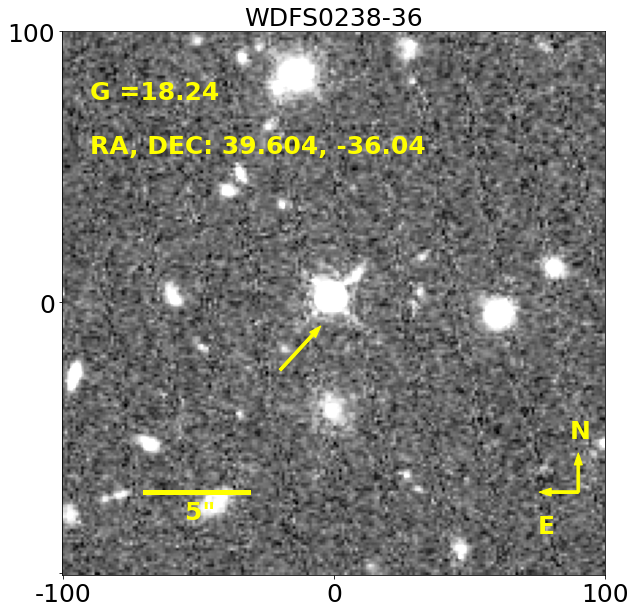

SSSJ183717.8-700251 (WDFS1837-70) idgq120i0_drz.fits


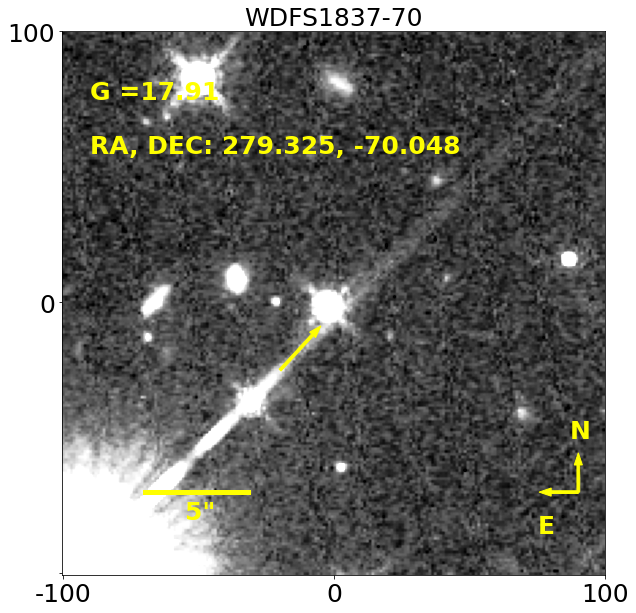

SDSS-J181424.13+785402.9 (WDFS1814+78) icmdr30l0_drz.fits


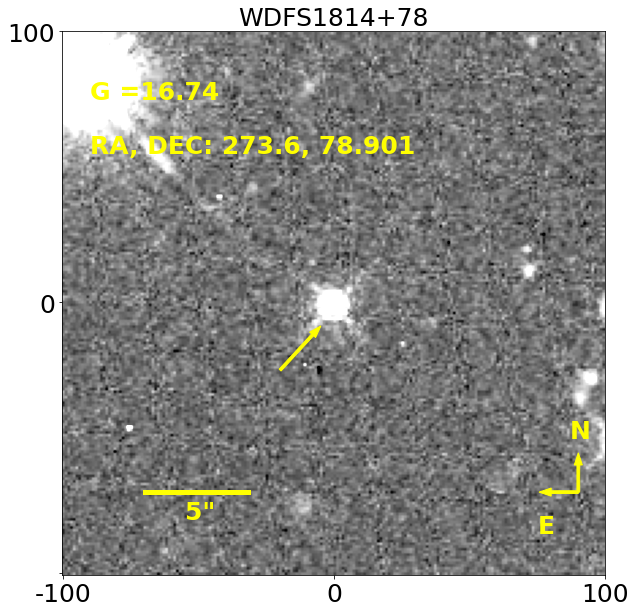

ATLAS020.503022-30.867762 (WDFS0122-30) idgq020i0_drz.fits


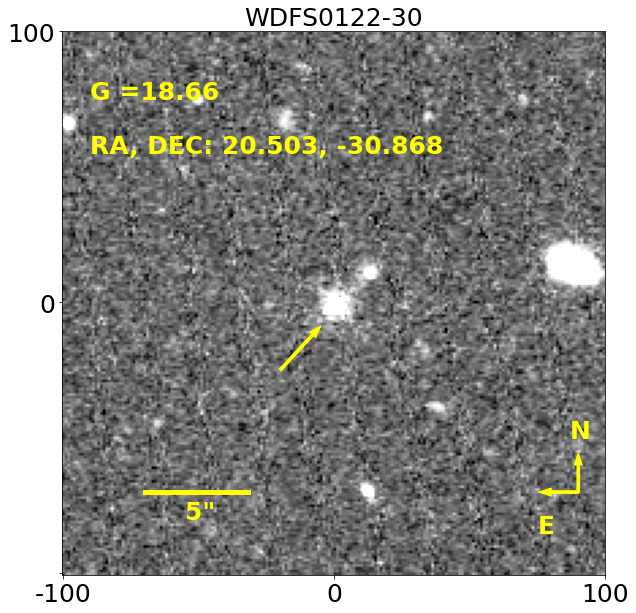

SDSS-J072752.76+321416.1 (WDFS0727+32) icmdp80j0_drz.fits


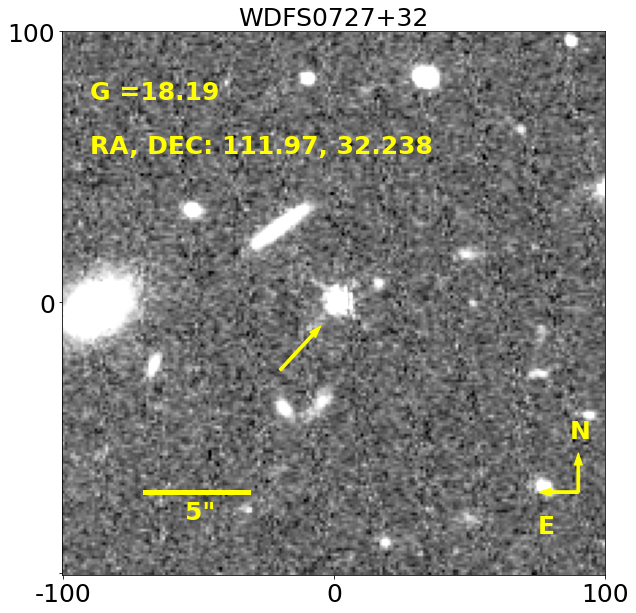

SDSS-J022817.16-082716.4 (WDFS0228-08) icmdp10g0_drz.fits


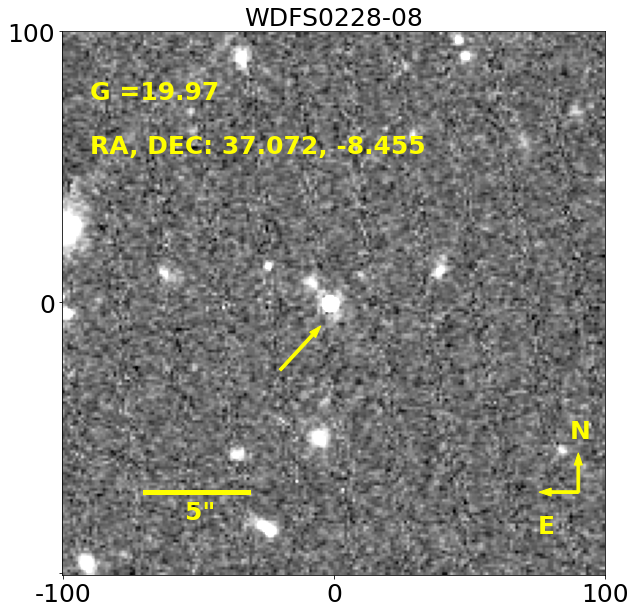

In [10]:
make_cutouts(all_files)